# <b><div style='padding:25px;background-color:#9B2335;color:white;border-radius:4px;font-size:100%;text-align: center'>Singapore  Resale Flat Prices Prediction<br></div>

## <p style="color:Khaki;"> Importing required libraries</p>

In [22]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr,kstest, norm, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
from wordcloud import WordCloud, STOPWORDS
from collections import Counter

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

## <span style="color:Khaki;">Reading cleaned Dataset

In [8]:
df1=pd.read_feather('df1.feather')

In [9]:
df1.sample(10)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year
84625,11,Serangoon,4 Room,93.0,New Generation,1984,442000.0,3,6,2020,228 Serangoon Ave 4 Serangoon,4752.688172,63
101271,10,Choa Chu Kang,5 Room,133.0,Model A,1993,323000.0,3,6,2002,438 Choa Chu Kang Ave 4 Choa Chu Kang,2428.571429,90
102095,7,Clementi,5 Room,113.0,Improved,2017,888000.0,3,6,2021,312C Clementi Ave 4 Clementi,7858.407080,95
19745,2,Pasir Ris,5 Room,134.0,Model A,1996,520000.0,3,15,2016,614 Elias Rd Pasir Ris,3880.597015,79
36994,1,Tampines,5 Room,122.0,Improved,1997,378000.0,3,3,2001,247 Simei St 5 Tampines,3098.360656,95
325226,6,Jurong East,5 Room,104.0,Standard,1979,348000.0,3,9,2010,403 Pandan Gdns Jurong East,3346.153846,68
293747,7,Punggol,5 Room,114.0,Premium Apartment,2004,425000.0,3,18,2009,166B Punggol Ctrl Punggol,3728.070175,94
49475,10,Yishun,3 Room,67.0,New Generation,1985,300000.0,3,9,2014,145 Yishun St 11 Yishun,4477.611940,70
88266,5,Woodlands,4 Room,91.0,Model A2,1997,188000.0,3,3,2002,743 Woodlands Circle Woodlands,2065.934066,94
110180,1,Hougang,5 Room,122.0,Improved,1992,364000.0,3,12,2003,465 Upp Serangoon Rd Hougang,2983.606557,88


## <span style="color:Khaki;">Defining variable type

In [10]:
continuous = ['floor_area_sqm', 'resale_price','price_per_sqm']

categorical = ['year','month' ,'town', 'flat_type','flat_model','lease_commence_date','floors','floor_no','remaining_lease_year']

## <p style="color:Khaki;"> Exploratory Data Analysis. Before Handling Skewness and Outliers</p>

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 120%"> Defining a function for statistical information.</span></span><br>

In [11]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]

    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}')

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

In [12]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

### <span style="color:Khaki;"> Numerical features Distribution

In [13]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
floor_area_sqm,927465.0,95.691246,25.824986,28.000000,73.00000,93.000000,113.0,3.070000e+02
resale_price,927465.0,320848.058806,170522.857301,5000.000000,193000.00000,297500.000000,418000.0,1.588000e+06
floor_no,927465.0,8.697199,4.822093,3.000000,6.00000,9.000000,12.0,5.100000e+01
price_per_sqm,927465.0,3318.137732,1532.133749,161.290323,2292.26087,2956.521739,4200.0,1.559140e+04


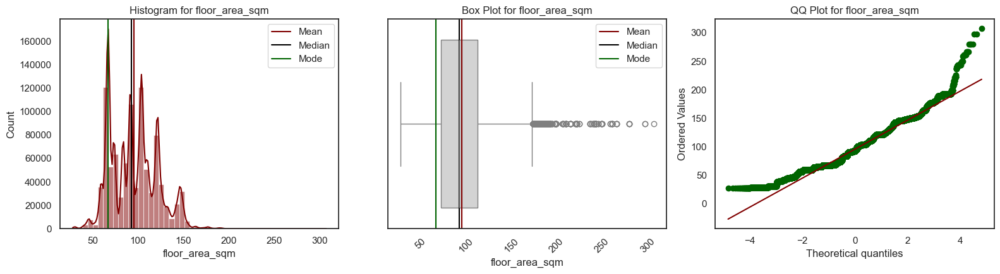



Skew for floor_area_sqm is 0.3661
Kurtosis for floor_area_sqm is -0.3464




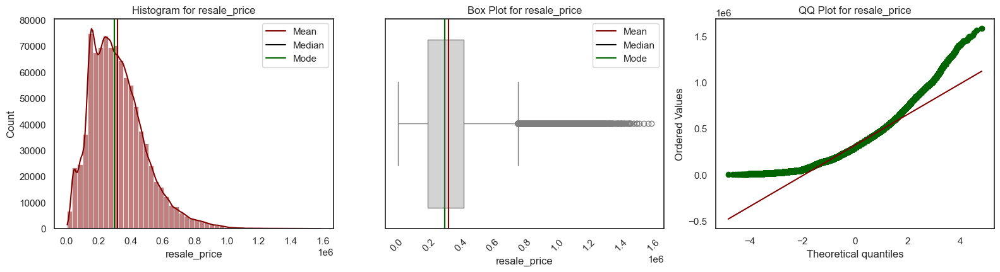



Skew for resale_price is 0.9422
Kurtosis for resale_price is 1.3735




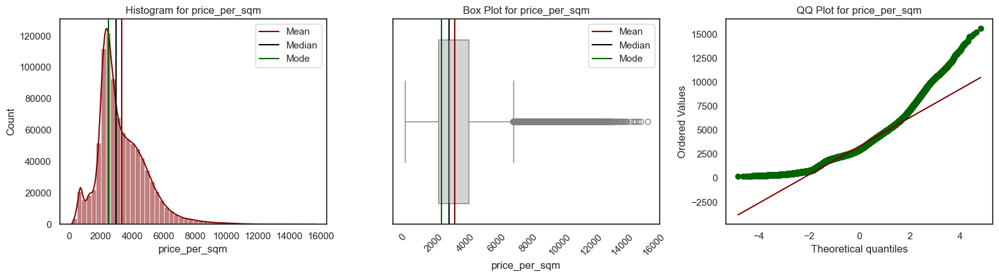



Skew for price_per_sqm is 1.0728
Kurtosis for price_per_sqm is 2.0849




In [14]:
color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

skewed_col = []


for i in continuous:
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    kurt=df1[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Floor Area SQM - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; The histogram indicates a right-skewed distribution. The higher mean (Right side than the median and mode), Skeness value of **0.3661**, the outliers on the upper whisker, the data point deviate on the QQ plot confirms the right skewed. </span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  The right skewness is also showing the presence of larger floor areas but in smaller quantities.</span><br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; This negative kurtosis value **-0.3464** suggests that the distribution is slightly lighter tails compared to a normal distribution.</span> <br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; &nbsp;Multiple peaks suggest possible sub-groups or clusters within the data.</span><br>
<span Style="color: DodgerBlue;font-size: 120%"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;&nbsp; There are numerous outliers above 150 sqm, indicating a significant number of observations much larger than the bulk of the data.</span>

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Resale Price - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; The histogram indicates a right-skewed distribution. The higher mean (Right side than the median and mode), Skeness value of **0.9422**, the outliers on the upper whisker, the data point deviate on the QQ plot confirms the heaby right skew. </span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  There are noticeable peaks around 0.2 to 0.4 million, indicating common resale prices. The long right tail shows the presence of higher resale prices, though in smaller quantities.</span><br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; This positive kurtosis value **1.3735** suggests that the distribution has heavier tails than a normal distribution.</span> <br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; &nbsp;Multiple peaks suggest possible sub-groups or clusters within the data.</span><br>
<span Style="color: DodgerBlue;font-size: 120%"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;&nbsp; TNumerous outliers above 0.6 million indicate a significant number of higher resale prices.</span>

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> We will not use Price per SQM for modeling but we just use it for detecting outliers and price variance.</span>

### <span style="color:Khaki;">Categorical features Distribution

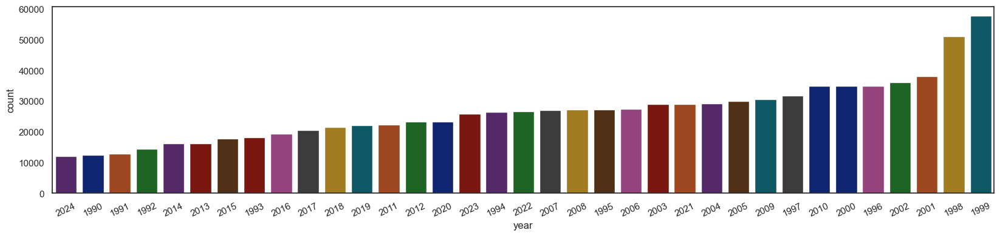

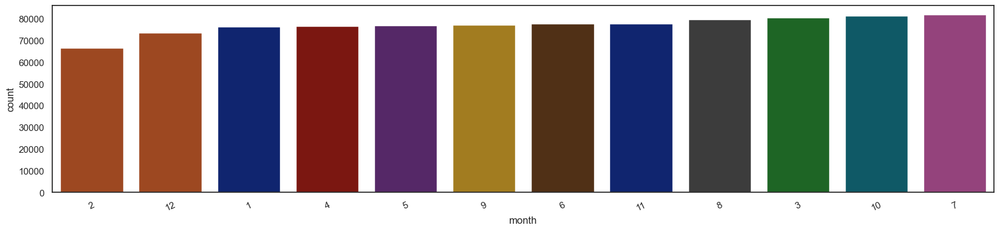

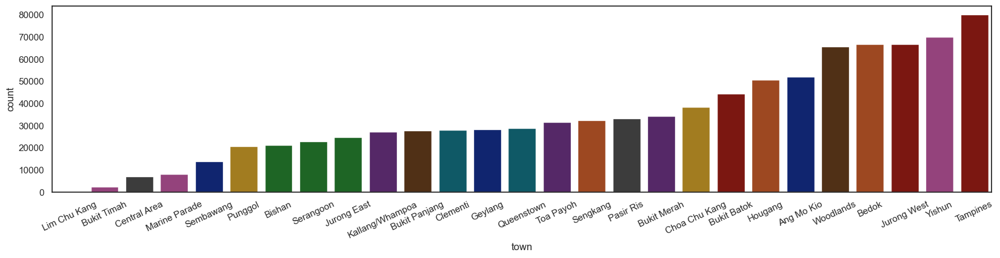

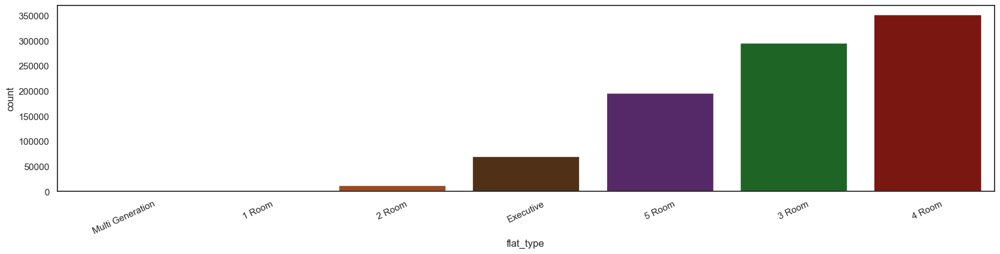

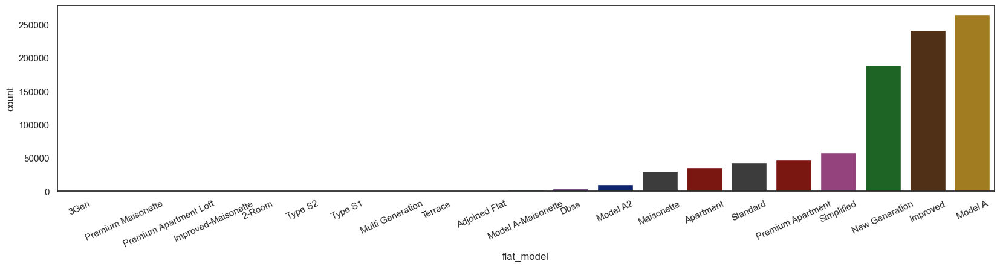

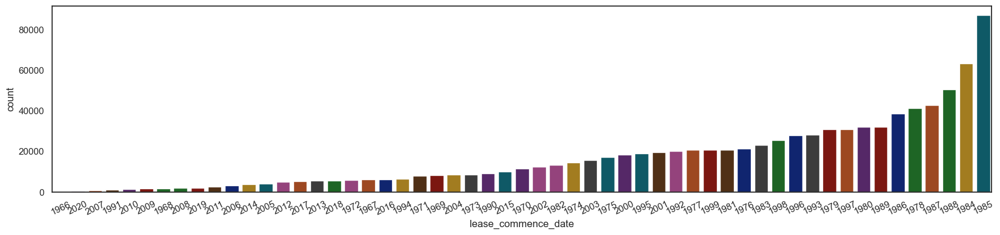

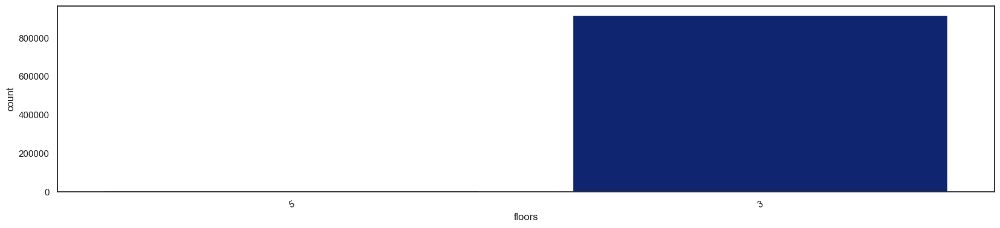

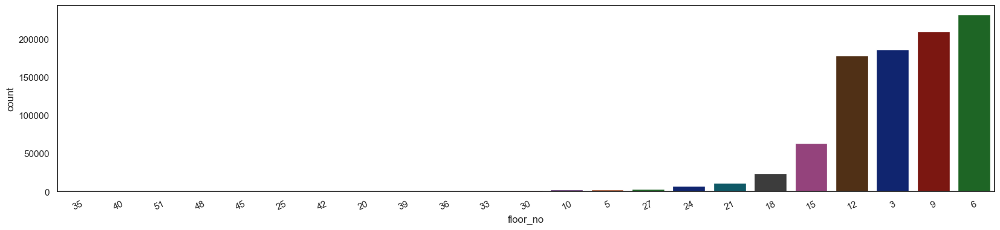

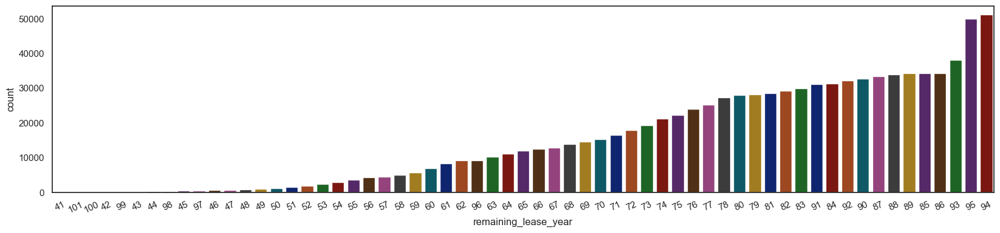

In [15]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df1, x=df1[i], hue=i, order = df1[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.xticks(rotation=25)

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Observations:**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Year - </b> </span>The data spans from 1990 to 2023. Noticeable peaks in specific years, especially around 1999 and 2022.</span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Month - </b> </span>he distribution across months is relatively uniform, with slightly differences in February and December.</span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Town - </b> </span>The data includes various towns with significant differences in the count. Tampines, Jurong West, and Woodlands have the highest counts</span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Flat Type - </b> </span>Noticeable sales in 3 Room and 4 Room flats than the other flat type.</span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Flat Model - </b> </span> The sales count of 62% flat models are extreamly low.24% flat models sales count are low. However, the New Generation, Improved, and Model A flats sales counts are extreanly high.</span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Floors - </b> </span>99% flats are 3 floor flats.</span> <br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; <span style="color: Tomato;font-size: 100%"> <b>Floor No - </b> </span> Most of the properties floor level are 6 followed by 9th floor, 3rd floor, and 12th floor. </span>

### <span style="color:Khaki;">Outliers based on the Categorical 

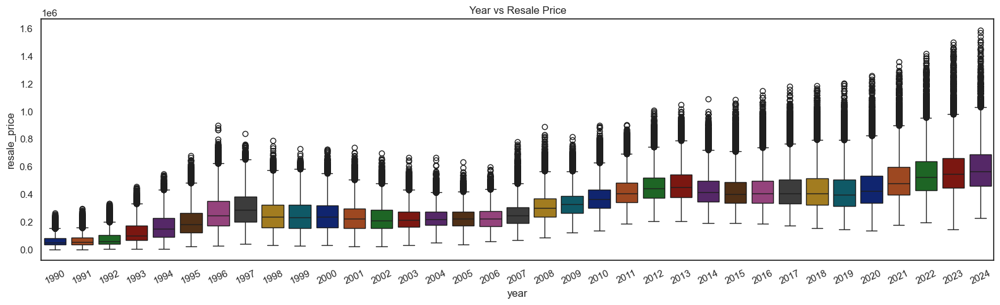

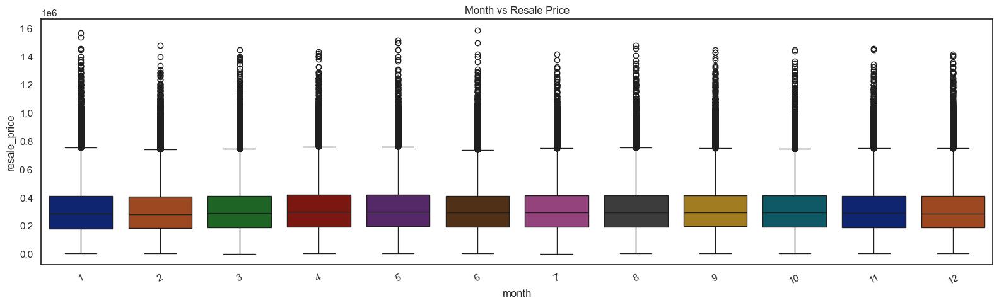

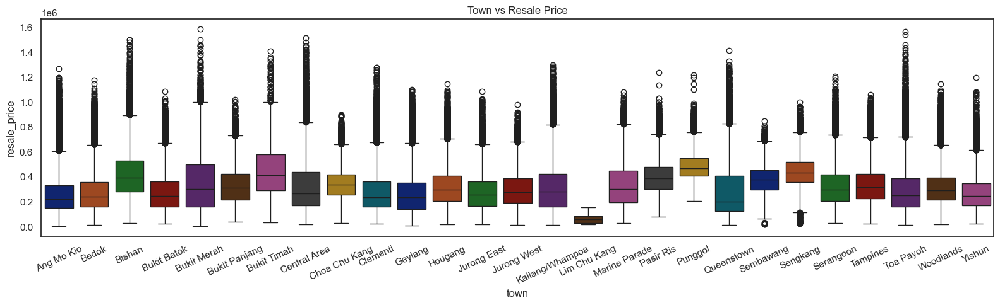

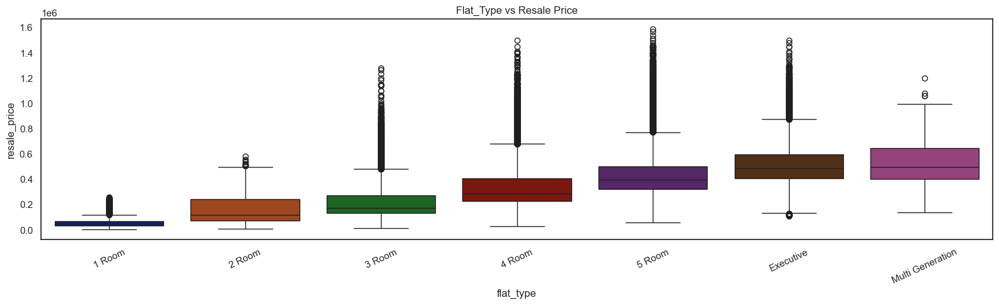

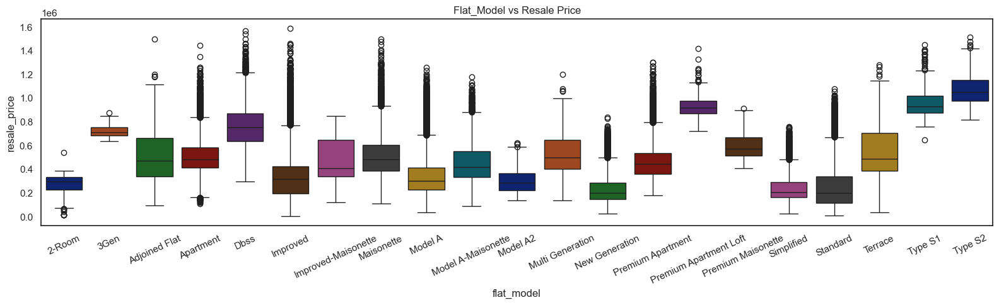

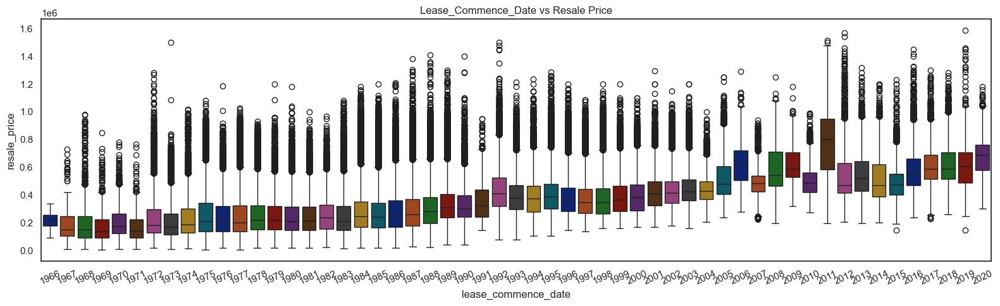

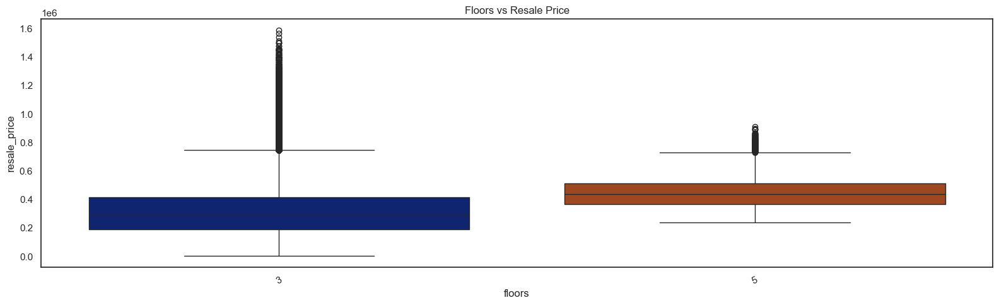

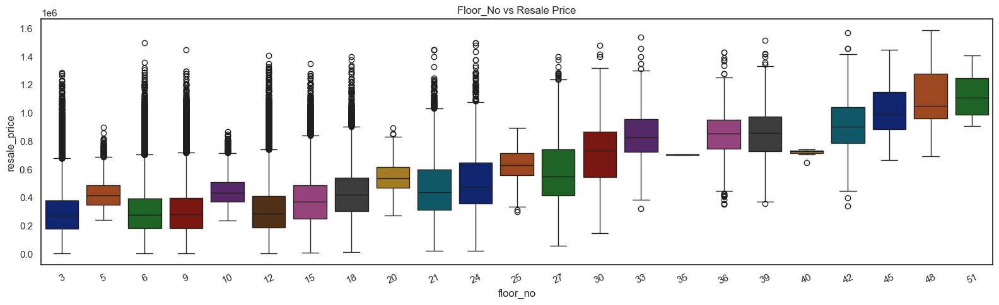

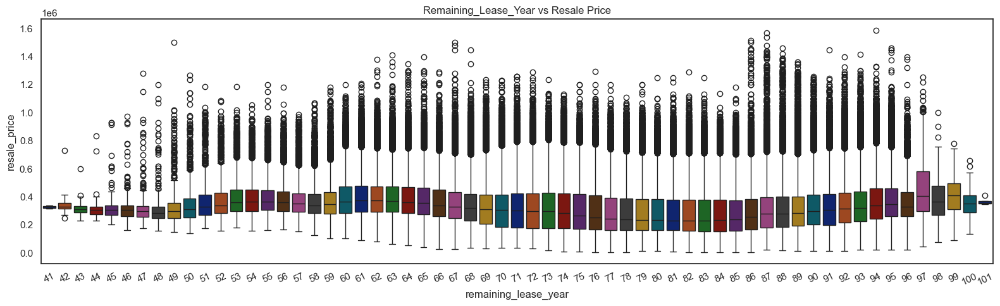

In [16]:
for i in categorical:
    plt.figure(figsize=(16,5))
    sns.boxplot(data=df1,x=i,y="resale_price",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Resale Price')
    plt.tight_layout()
    plt.show()

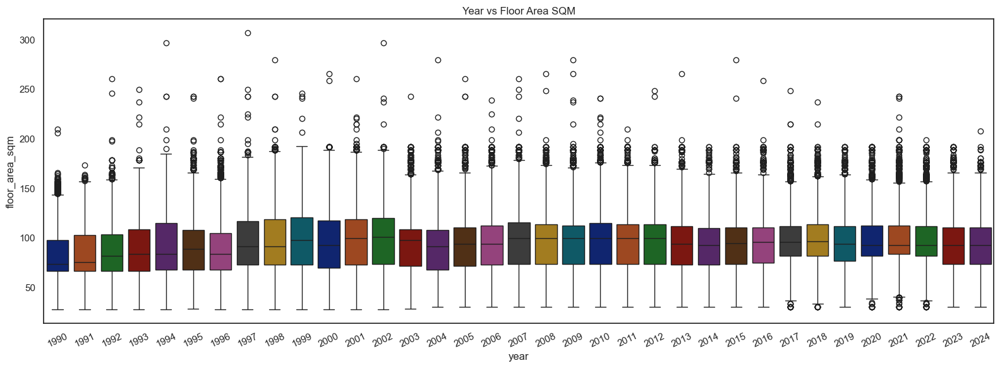

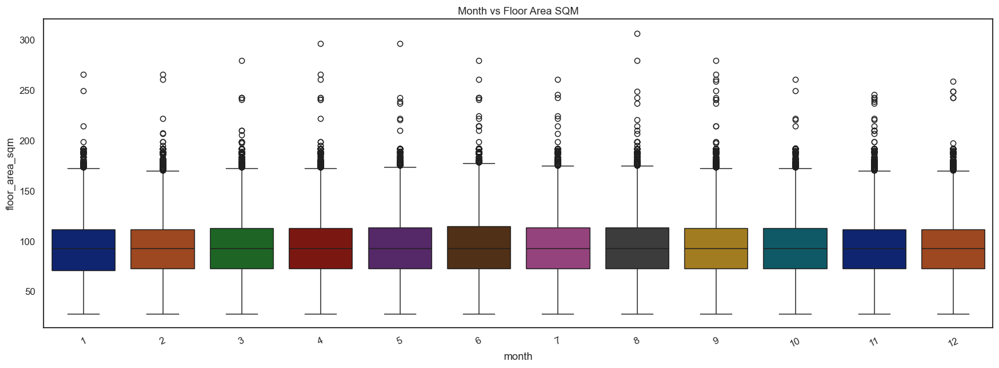

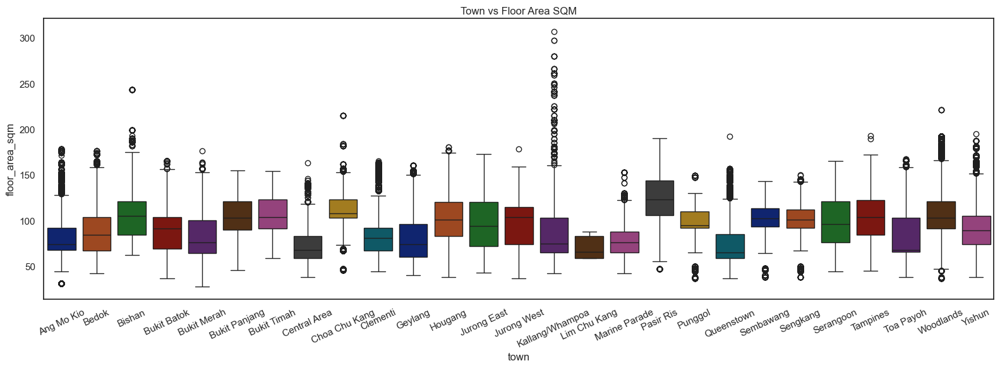

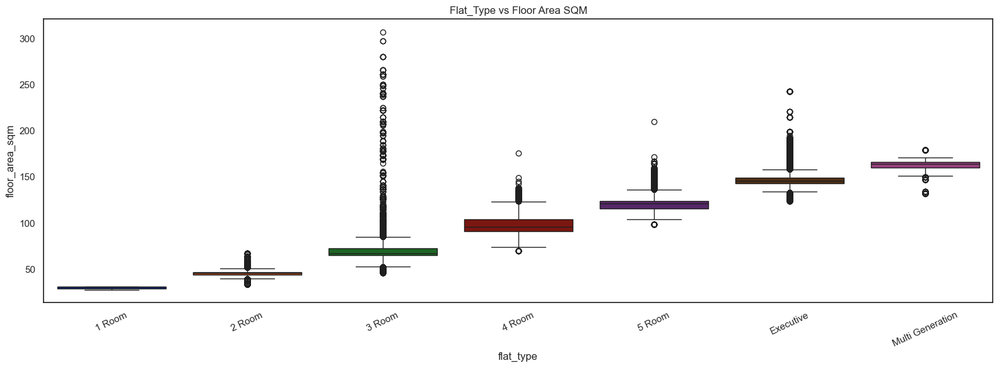

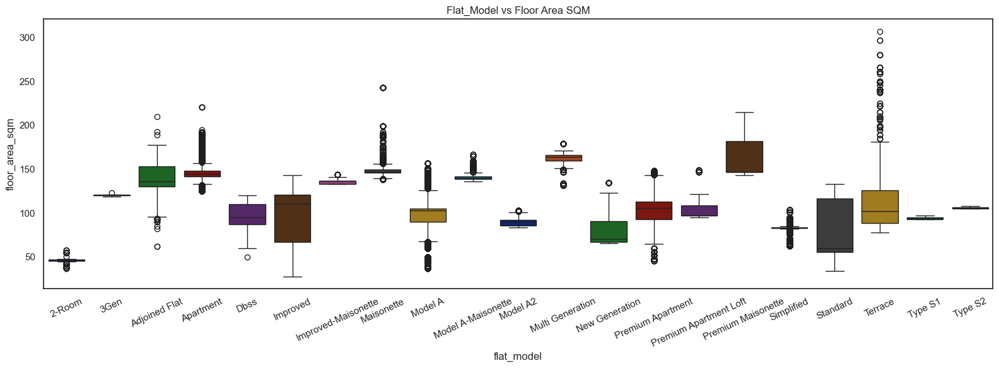

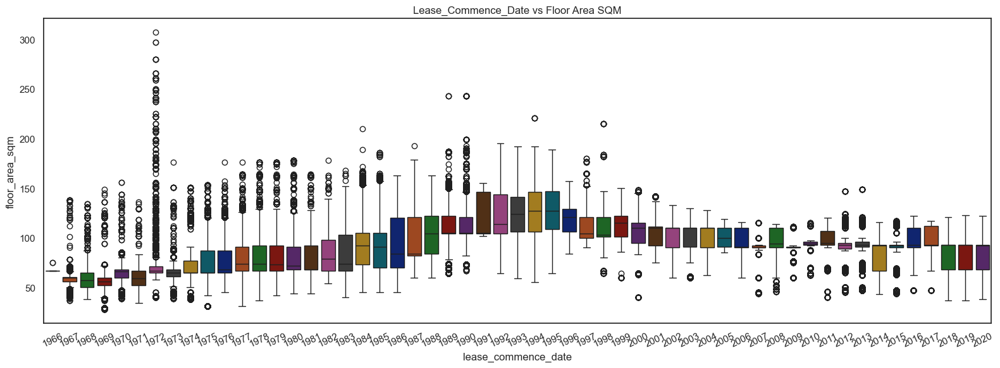

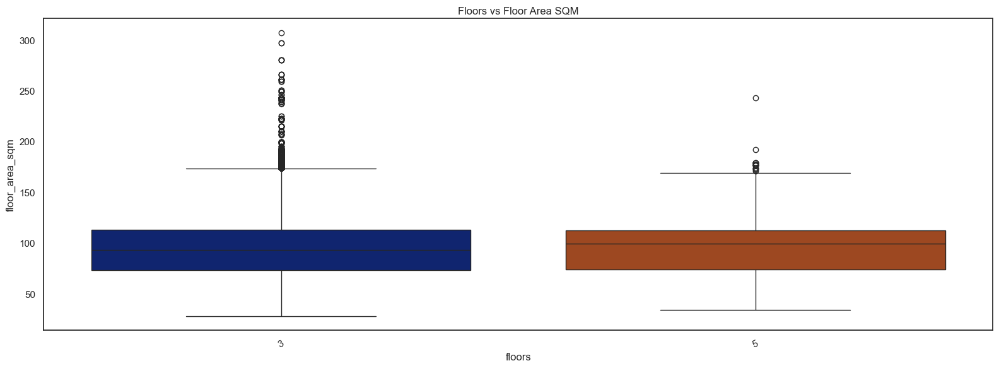

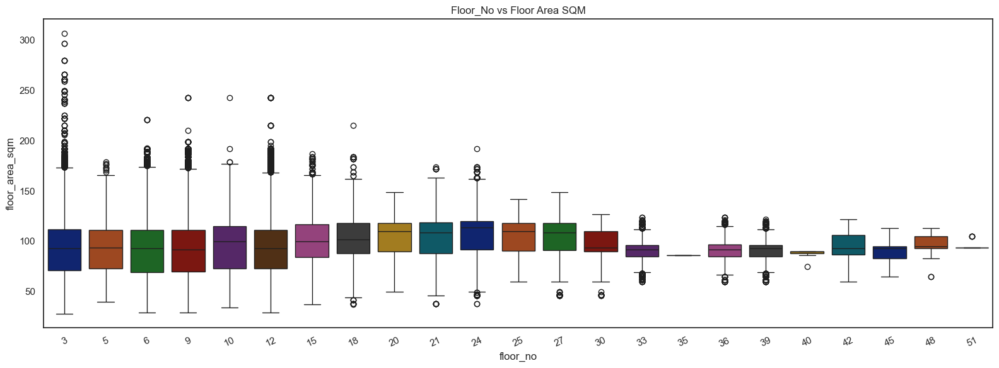

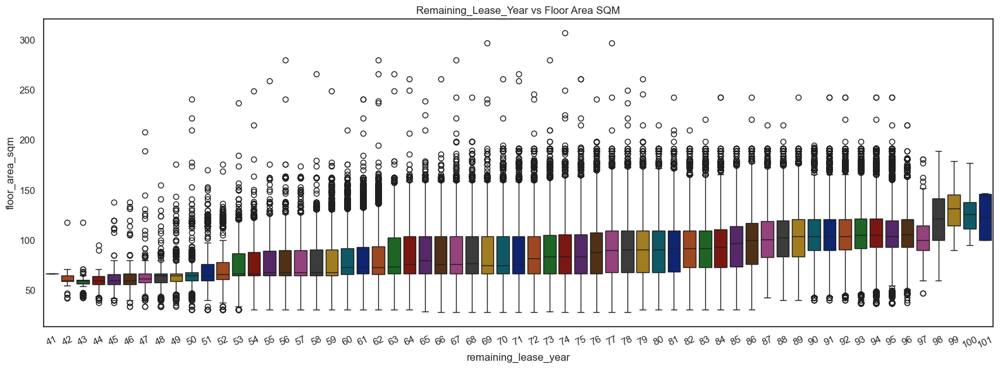

In [17]:
for i in categorical:
    plt.figure(figsize=(16,6))
    sns.boxplot(data=df1,x=i,y="floor_area_sqm",hue=i,palette='dark',legend=False,)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Floor Area SQM')
    plt.tight_layout()
    plt.show()


<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 130%;background-color:"> **We have outliers in all clusters for both Resale Price and Floor area SQM.**</span>

Combine storey range and bedroom to analyse outlier

### <span style="color:Khaki;"> Word Cloud - Checking the frequency in the categorical data

#### <span style="color:Khaki;">Frequency of Flat Type and Flat Model

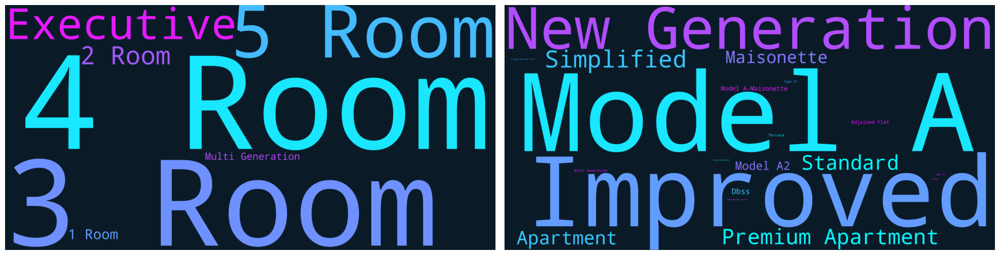

In [18]:
Flat_type = Counter(df1['flat_type'])
Flat_model = Counter(df1['flat_model'])

wordCloud_Flat_type = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_type.generate_from_frequencies(Flat_type)

# Add this line to create wordCloud_Flat_model
wordCloud_Flat_model = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_model.generate_from_frequencies(Flat_model)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_Flat_type, interpolation='bilinear',cmap='Blues')
plt.subplot(1,2,2)
plt.imshow(wordCloud_Flat_model, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 130%;background-color:"> **Word cloud also confirms the same - 3 and 4 Rooms in the flat type and Model A, Improved, New Generations has most freqenzy.**</span>

#### <span style="color:Khaki;">Frequency of Town and Floor No

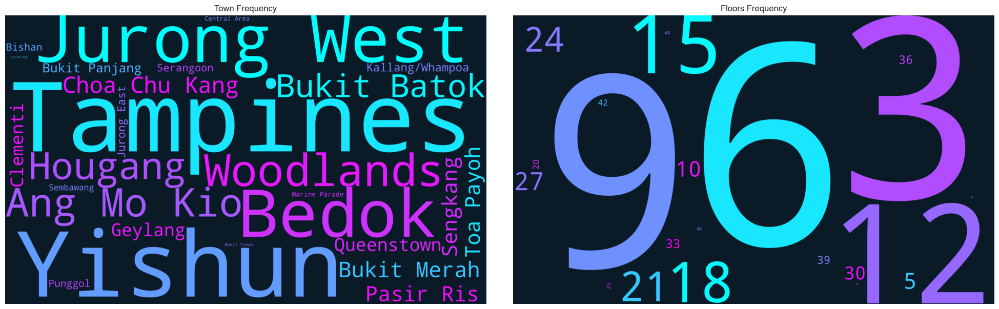

In [19]:
town = Counter(df1['town'])
full_address = Counter(df1['floor_no'].astype('str'))

wordCloud_town = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_town.generate_from_frequencies(town)

# Add this line to create wordCloud_Flat_model
wordCloud_full_address = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_full_address.generate_from_frequencies(full_address)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_town, interpolation='bilinear',cmap='Blues')
plt.title('Town Frequency')
plt.subplot(1,2,2)
plt.imshow(wordCloud_full_address, interpolation='bilinear')
plt.title('Floors Frequency')
plt.axis('off')
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 130%;background-color:"> **Word cloud also confirms the same as what we observed in the categorical distribution.**</span>

### <span style="color:Khaki;"> Resale Price Analysis</span>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; Checking how categorical features are influencing our target feature using statistical test.</span>

In [24]:
def analyze_categorical_relationship(df, continuous_var, categorical_var):
    # Perform one-way ANOVA
    model = ols(f'{continuous_var} ~ C({categorical_var})', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    # Calculate eta-squared (effect size)
    ssr = anova_table.loc['C(' + categorical_var + ')', 'sum_sq']
    sst = ssr + anova_table.loc['Residual', 'sum_sq']
    eta_squared = ssr / sst
    
    # Convert eta-squared to percentage
    significance_percentage = eta_squared * 100
    
    # Determine if there's a significant relationship
    p_value = anova_table.loc['C(' + categorical_var + ')', 'PR(>F)']
    alpha = 0.05  # significance level
    is_significant = p_value < alpha
    
    print(f"Relationship between {continuous_var} and {categorical_var}:")
    print(f"ANOVA: F-statistic = {anova_table.loc['C(' + categorical_var + ')', 'F']:.4f}, p-value = {p_value:.4f}")
    print(f"{categorical_var} has {significance_percentage:.2f}% significance with {continuous_var}")
    print(f"There is {'a' if is_significant else 'no'} statistically significant relationship between {categorical_var} and {continuous_var}.")
    print()
    
# Analyze relationships

for cat_var in categorical:
    analyze_categorical_relationship(df1, 'resale_price', cat_var)

Relationship between resale_price and year:
ANOVA: F-statistic = 30875.3446, p-value = 0.0000
year has 53.09% significance with resale_price
There is a statistically significant relationship between year and resale_price.

Relationship between resale_price and month:
ANOVA: F-statistic = 49.4007, p-value = 0.0000
month has 0.06% significance with resale_price
There is a statistically significant relationship between month and resale_price.

Relationship between resale_price and town:
ANOVA: F-statistic = 3585.7858, p-value = 0.0000
town has 9.13% significance with resale_price
There is a statistically significant relationship between town and resale_price.

Relationship between resale_price and flat_type:
ANOVA: F-statistic = 83626.7422, p-value = 0.0000
flat_type has 35.11% significance with resale_price
There is a statistically significant relationship between flat_type and resale_price.

Relationship between resale_price and flat_model:
ANOVA: F-statistic = 16073.8675, p-value = 0.0

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Year - </b> </span>This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Month - </b> </span>No signs for significance.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Town - </b> </span>This is also influcing resale price.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Flat Type - </b> </span>This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Flat Model - </b> </span>This feature influencing resale price moderately.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Lease Commence Year - </b> </span>This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Floors - </b> </span>Since we have less classes in the featuer it will not influence. We get the same result in the stats test.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Floor No - </b> </span>As we seeen above there are less data points in the most of the floors so influences are low.</span><br>

<span Style="color: DodgerBlue;font-size: 120%"> &#9830; <span style="color: Tomato;font-size: 100%"> <b>Remaining Lease Year - </b> </span>Lease commence year shows significant influence where this features shows low. We derived this feature from the lease commence year.</span><br>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 130%;background-color:"> **Let's compare above statistical results by plotting these categorical features along with resale price.**</span>

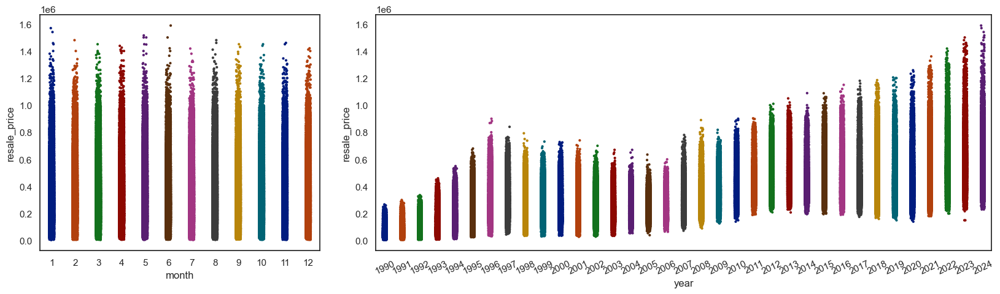

In [43]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="month", y="resale_price", hue="month",palette='dark',s=3, legend=False,ax=ax1)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="year", y="resale_price", hue="year",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

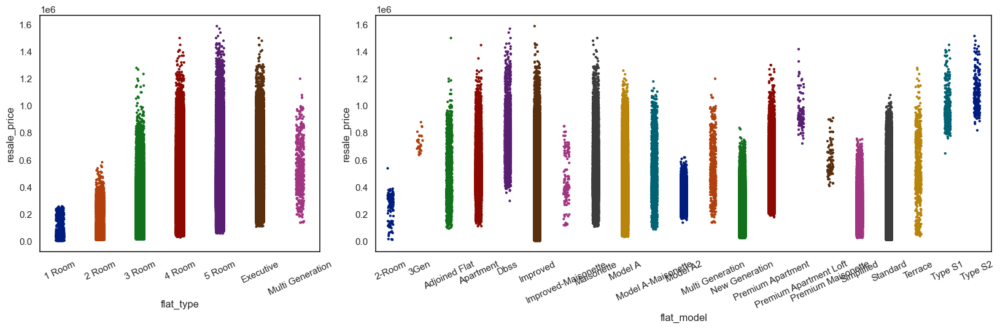

In [45]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="flat_type", y="resale_price", hue="flat_type",palette='dark',s=3, legend=False,ax=ax1)
plt.xticks(rotation=25)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="flat_model", y="resale_price", hue="flat_model",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

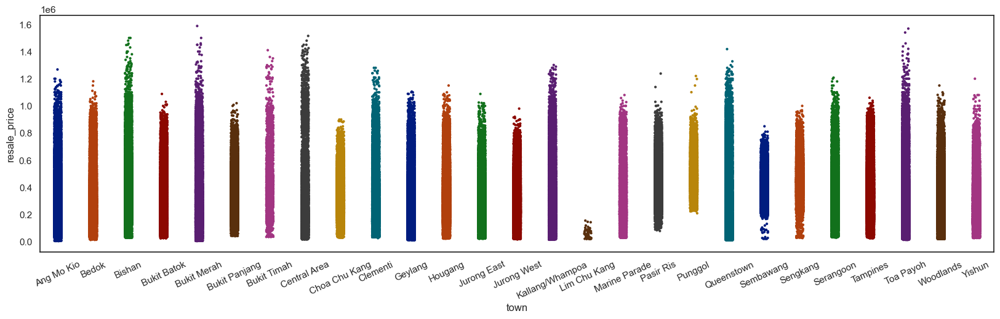

In [48]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="town", y="resale_price", hue="town",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

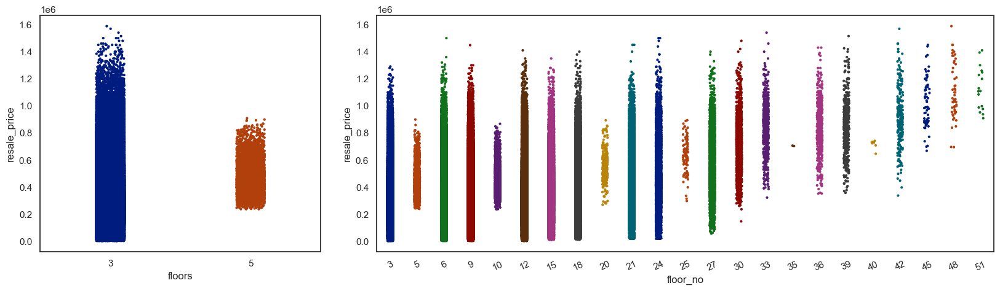

In [41]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="floors", y="resale_price", hue="floors",palette='dark',s=3, legend=False,ax=ax1)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="floor_no", y="resale_price", hue="floor_no",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

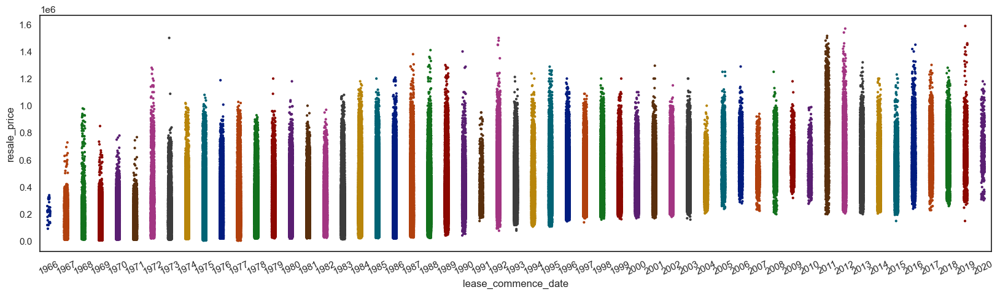

In [51]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="lease_commence_date", y="resale_price", hue="lease_commence_date",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

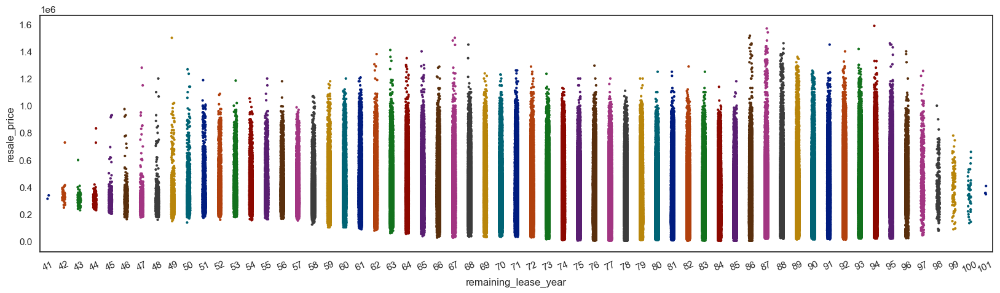

In [52]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="remaining_lease_year", y="resale_price", hue="remaining_lease_year",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

### <span style="color:Khaki;"> Floor Area SQM Analysis </span>

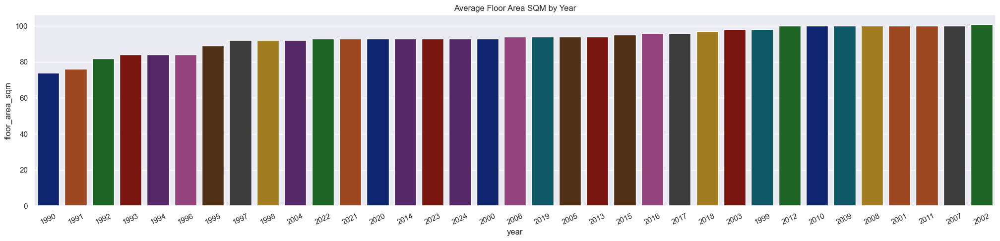

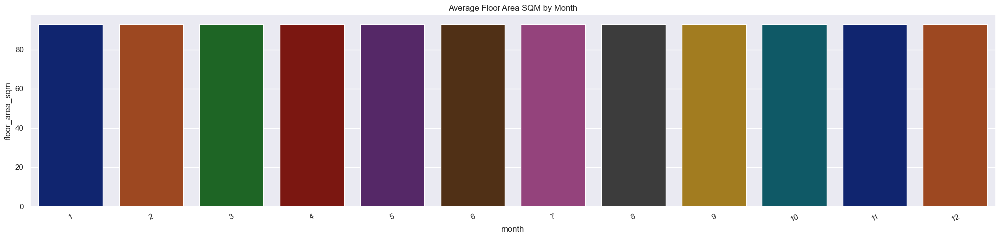

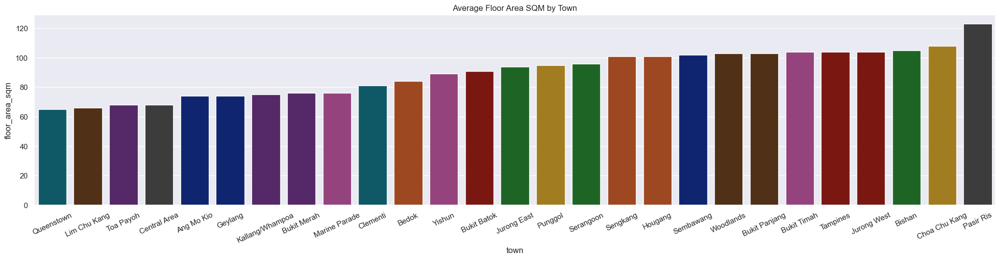

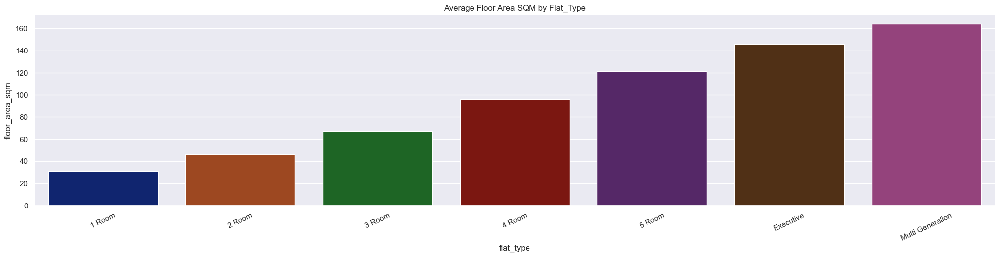

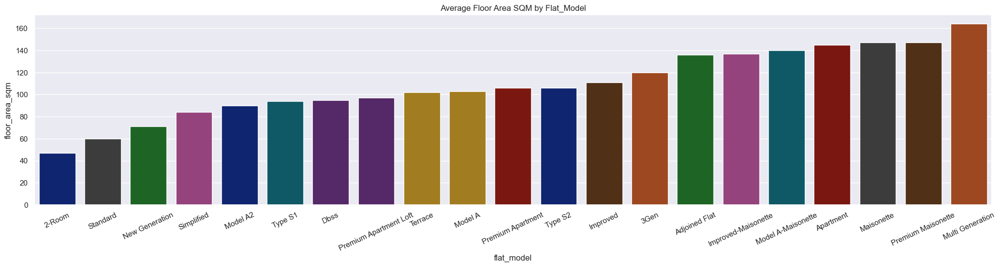

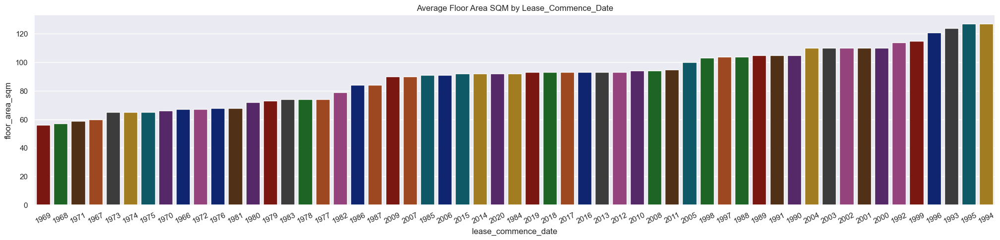

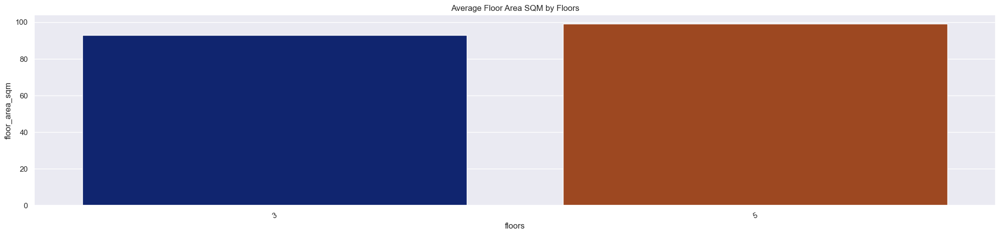

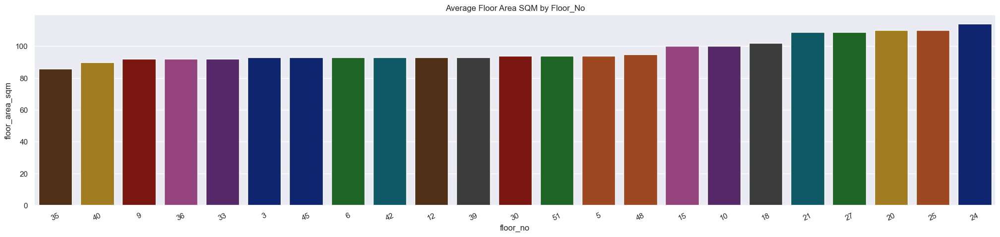

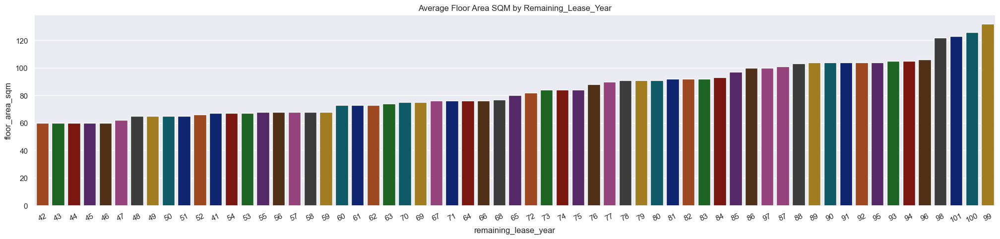

In [53]:
sns.set_theme( font_scale=1)  
# categorical.remove('floor_area_sqm')
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['floor_area_sqm'].median().reset_index().sort_values('floor_area_sqm')
    sns.barplot(data=data, x=data[i], y=data['floor_area_sqm'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average Floor Area SQM by {i.title()}')
    plt.show()
# categorical.append('floor_area_sqm')

### Relationship Between Continuous Features and Target

In [ ]:
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='DeJaVu Sans Mono', font_scale=2,color_codes=True, rc=None)
total_var=len(continuous)
plot_col=3
plot_row=math.ceil(total_var / 3)

fig, axes = plt.subplots(plot_row, plot_col, figsize=(50, 8))
axes = axes.flatten()
for i, var in  enumerate(continuous):
    sns.scatterplot(data=df1, x=var, y="resale_price", color='maroon',ax=axes[i],s=100)
    axes[i].set_title(f'Scatter plot: {var} vs Resale Price')

for i in range(i + 1, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1,color_codes=True, rc=None)


### Relationship Between Categorical Features and Target

In [ ]:
sns.set_theme( font_scale=1)  
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['resale_price'].median().reset_index().sort_values('resale_price')
    sns.barplot(data=data, x=data[i], y=data['resale_price'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average resale_price by {i}')
    plt.show()

### Pair Plot

<Figure size 1800x2000 with 0 Axes>

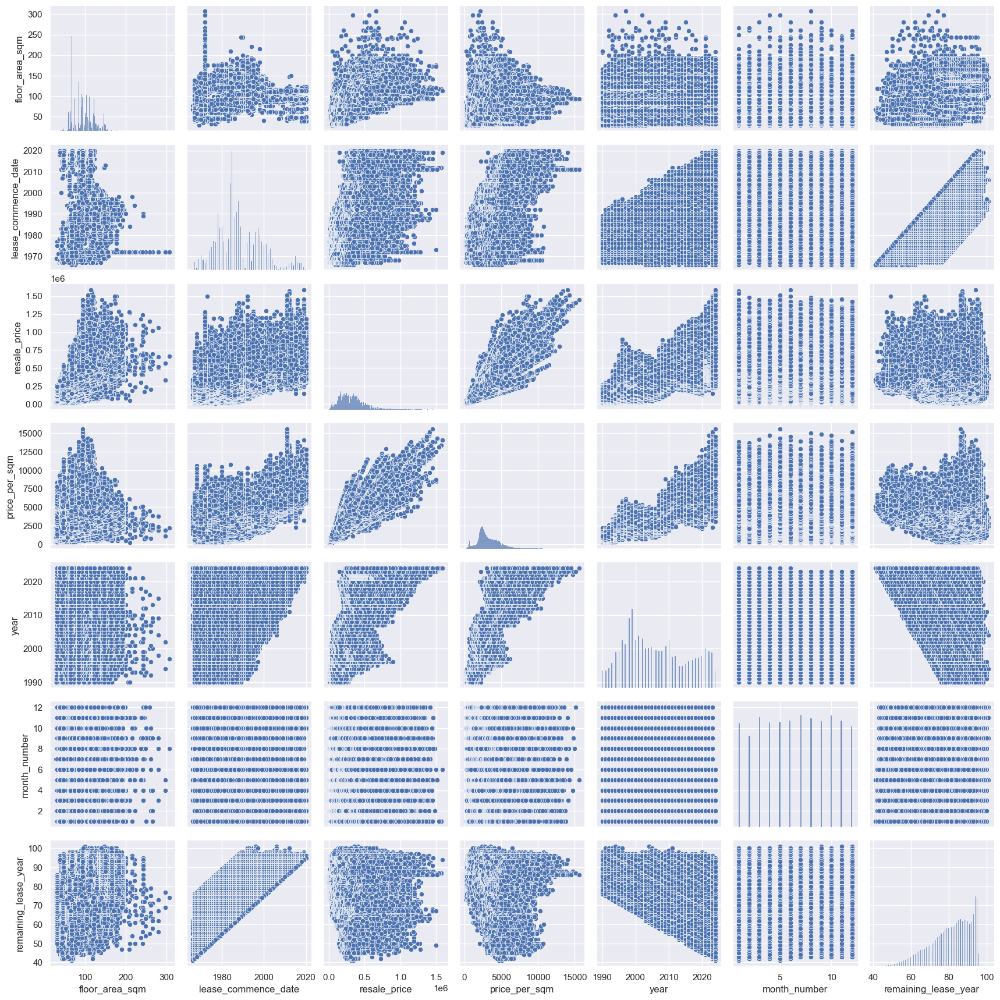

In [66]:
plt.figure(figsize=(18,20))
sns.pairplot(data=df1)
plt.show()

### Resale Price by Flat Type and Lease Commence Date

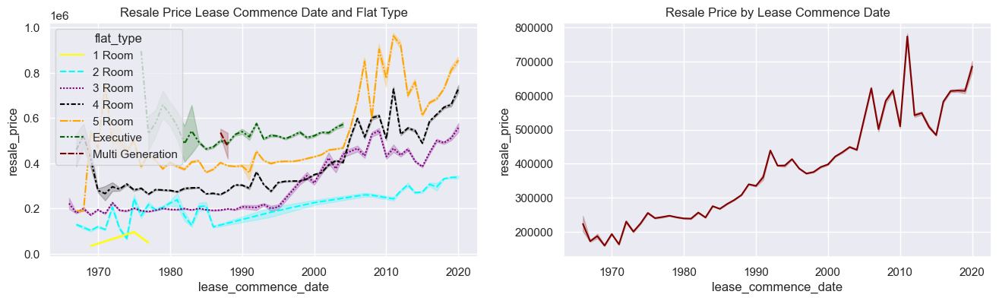

In [82]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Lease Commence Date and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',color='maroon')
plt.title("Resale Price by Lease Commence Date")

plt.show()

### Resale Price by Year and Flat Type

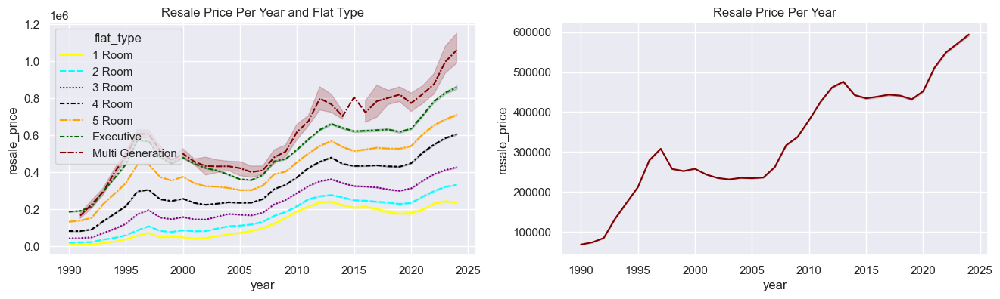

In [83]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='year', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Per Year and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by Avg_storey_range and Flat Type

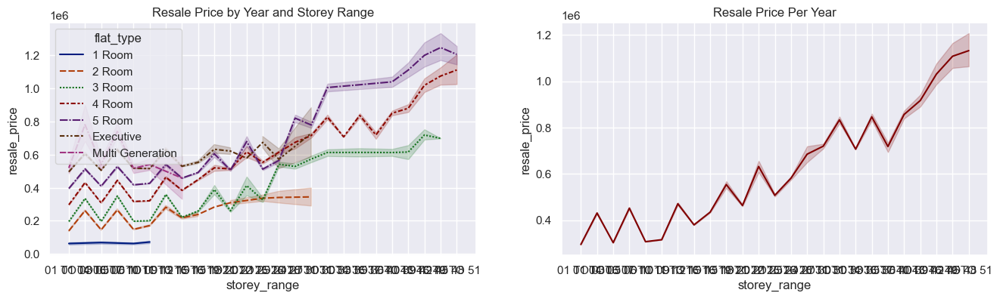

In [60]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='storey_range', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='storey_range', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Resale Price by remaining_lease_year and Flat Type

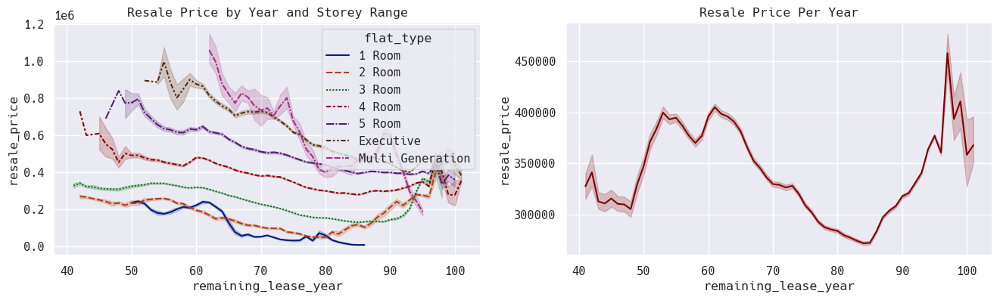

In [75]:
sns.set_theme( font_scale=1,font='Hack Nerd Font')

plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### Normality Test

In [63]:
continuous = ['floor_area_sqm', 'price_per_sqm', 'resale_price',]

for var in continuous:
    stat, p = kstest(df1[var], 'norm', args=(df1[var].mean(), df1[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for floor_area_sqm: Statistics=0.09941099273674198, p=0.0
floor_area_sqm does not look normally distributed.

K-S Test for price_per_sqm: Statistics=0.09489535653294501, p=0.0
price_per_sqm does not look normally distributed.

K-S Test for resale_price: Statistics=0.059450367412785865, p=0.0
resale_price does not look normally distributed.



In [64]:
from scipy.stats import skew, kurtosis

for var in continuous:
    skewness = skew(df1[var])
    kurt = kurtosis(df1[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

floor_area_sqm - Skewness: 0.3660709490993199, Kurtosis: -0.34641220087085633
floor_area_sqm looks normally distributed.

price_per_sqm - Skewness: 1.0728419731408791, Kurtosis: 2.0848609936408025
price_per_sqm does not look normally distributed.

resale_price - Skewness: 0.9421620158728324, Kurtosis: 1.373502157753908
resale_price does not look normally distributed.



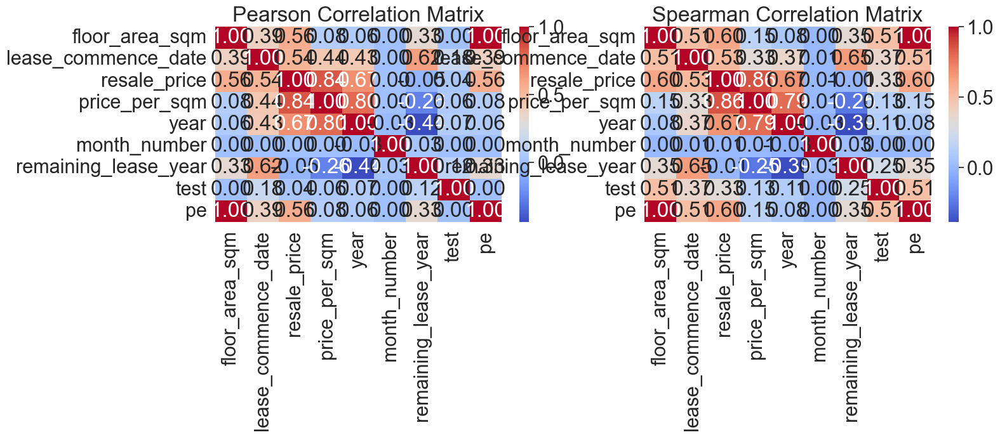

In [65]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

### Experimenting with a few types of data transformation techniques to see which one suits best.

In [66]:
skew_dict=dict(df1[continuous].skew())
skew_dict

{'floor_area_sqm': 0.3660726547241211,
 'price_per_sqm': 1.072843708264345,
 'resale_price': 0.942163539645637}

In [67]:
def boxcox_transform(x):
    # Perform Box-Cox transformation
    transformed_data,lmbda = boxcox(x)
    return transformed_data,lmbda

In [68]:
method_functions =  {
    'log': np.log,
    'square': np.sqrt,
    'rec': lambda x: 1 / x,
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'pow': lambda x: np.power(x, 2),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method):
    normalized_df=pd.DataFrame()

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name in ['boxcox']:
                transformed_values = func(df[col])[0]
            else:
                transformed_values = func(df[col])
            normalized_df[new_column] = transformed_values

    return normalized_df

In [69]:
normalized_df=skewness_checker(df1, continuous, method_functions)
normalized_df

,floor_area_sqm_log,price_per_sqm_log,resale_price_log,floor_area_sqm_square,price_per_sqm_square,resale_price_square,floor_area_sqm_rec,price_per_sqm_rec,resale_price_rec,floor_area_sqm_sig,...,resale_price_sig,floor_area_sqm_pow,price_per_sqm_pow,resale_price_pow,floor_area_sqm_exp,price_per_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,price_per_sqm_boxcox,resale_price_boxcox
0,3.433987,5.670993,9.104980,5.567764,17.038855,94.868330,0.032258,0.003444,0.000111,1.0,...,1.0,961.0,8.428720e+04,8.100000e+07,1.987341,3.108681,6.178009,6.593803,21.894497,121.361716
1,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.593803,18.221192,101.219209
2,3.433987,5.553210,8.987197,5.567764,16.064387,89.442719,0.032258,0.003875,0.000125,1.0,...,1.0,961.0,6.659729e+04,6.400000e+07,1.987341,3.036307,6.034176,6.593803,20.764940,115.137050
3,3.433987,5.265528,8.699515,5.567764,13.912167,77.459667,0.032258,0.005167,0.000167,1.0,...,1.0,961.0,3.746098e+04,3.600000e+07,1.987341,2.866539,5.696791,6.593803,18.221192,101.219209
4,4.290460,6.471690,10.762149,8.544003,25.427846,217.255610,0.013699,0.001547,0.000021,1.0,...,1.0,5329.0,4.180597e+05,2.227840e+09,2.358656,3.648580,8.605744,9.865798,31.172901,253.461991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,4.718499,8.793200,13.511699,10.583005,81.174415,859.069264,0.008929,0.000152,0.000001,1.0,...,1.0,12544.0,4.341869e+07,5.446440e+11,2.569470,5.804538,14.914588,11.902491,83.257104,851.806525
181258,4.804021,8.625827,13.429848,11.045361,74.657689,824.621125,0.008197,0.000179,0.000001,1.0,...,1.0,14884.0,3.106692e+07,4.624000e+11,2.613798,5.613449,14.672421,12.346850,77.667050,821.690977
181259,4.983607,8.596182,13.579788,12.083046,73.559220,888.819442,0.006849,0.000185,0.000001,1.0,...,1.0,21316.0,2.927848e+07,6.241000e+11,2.709384,5.580265,15.119082,13.323874,76.715625,877.695601
181260,4.983607,8.831904,13.815511,12.083046,82.760589,1000.000000,0.006849,0.000146,0.000001,1.0,...,1.0,21316.0,4.691312e+07,1.000000e+12,2.709384,5.849644,15.848932,13.323874,84.604298,973.536281


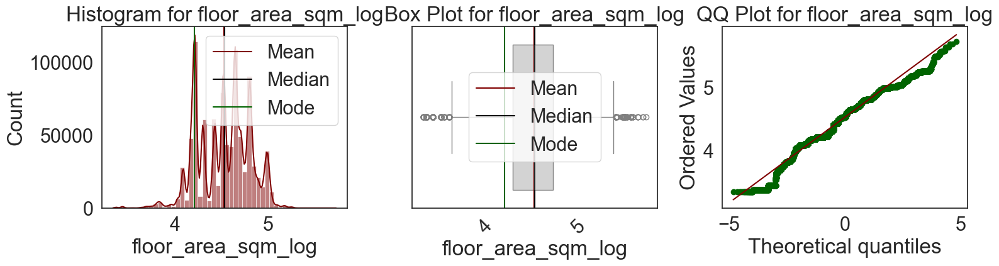



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




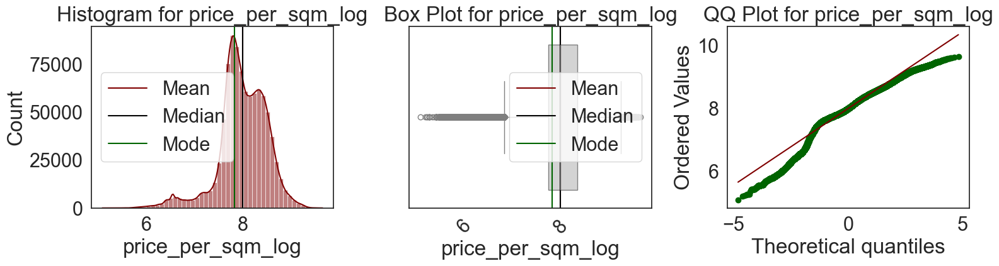



Skew for price_per_sqm_log is -0.82

Kurtosis for price_per_sqm_log is 1.87




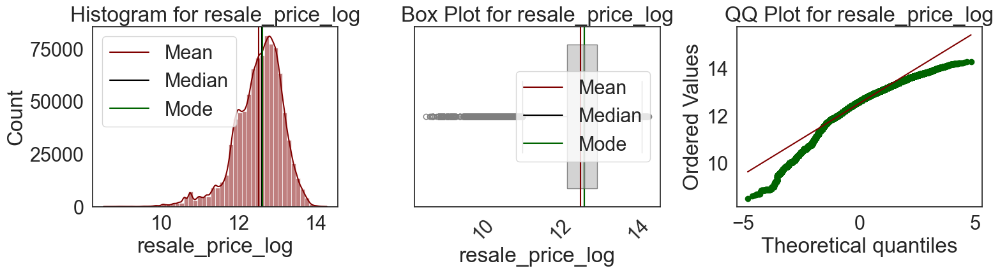



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.61




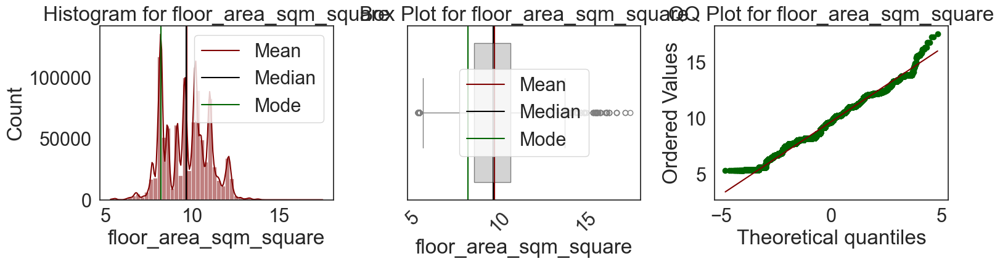



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




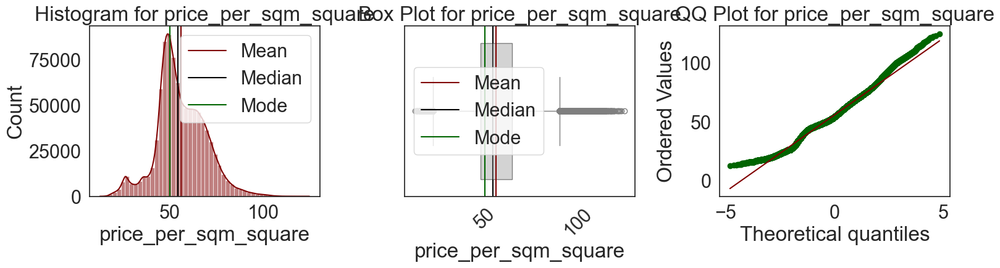



Skew for price_per_sqm_square is 0.22

Kurtosis for price_per_sqm_square is 0.57




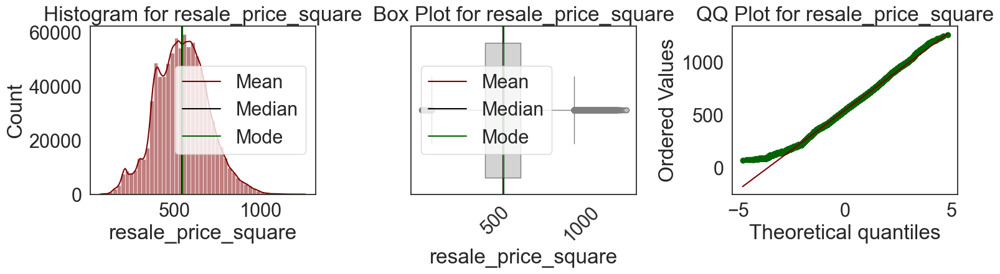



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




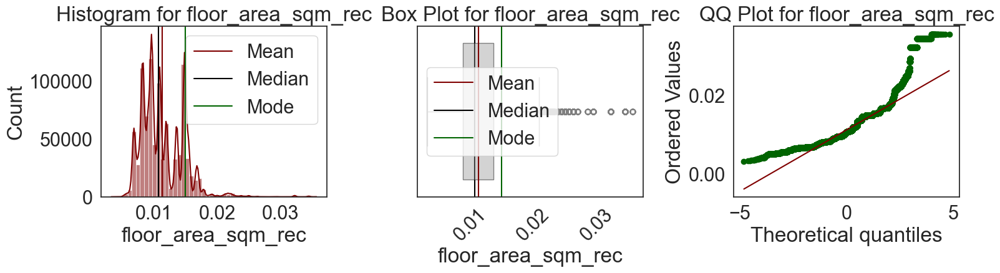



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




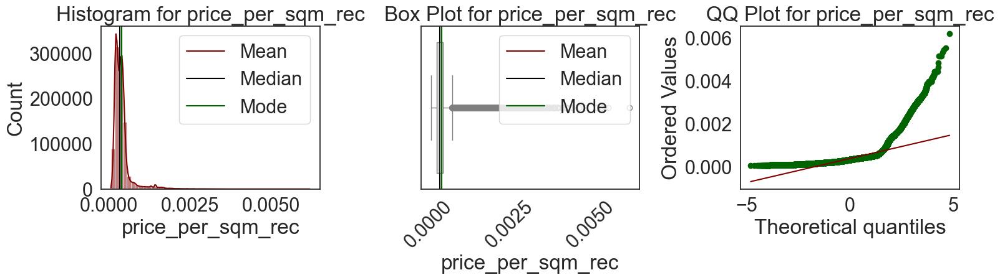



Skew for price_per_sqm_rec is 4.09

Kurtosis for price_per_sqm_rec is 24.62




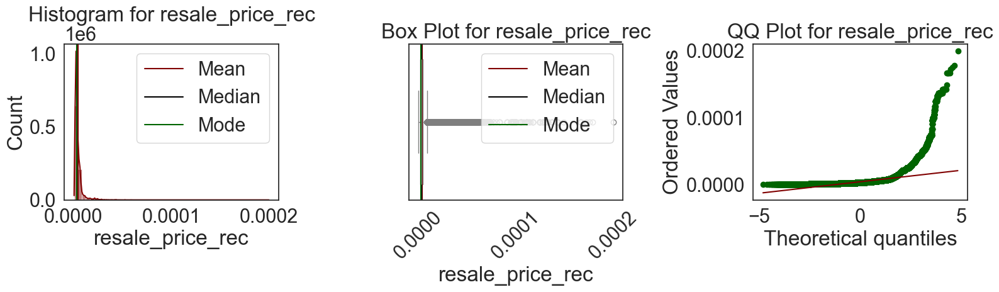



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.40




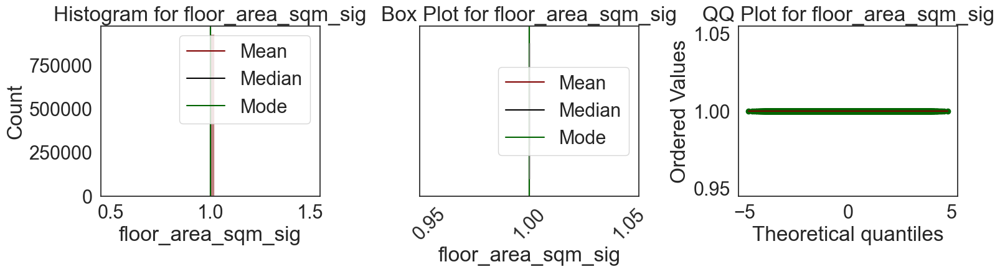



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




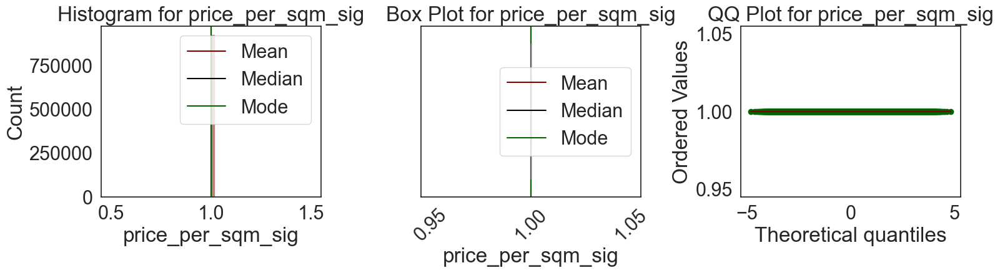



Skew for price_per_sqm_sig is 0.00

Kurtosis for price_per_sqm_sig is 0.00




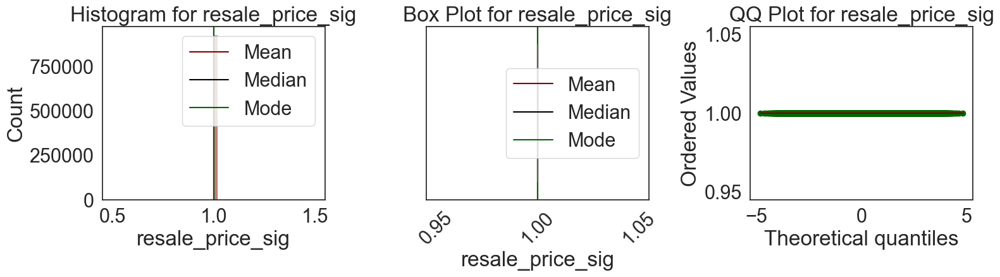



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




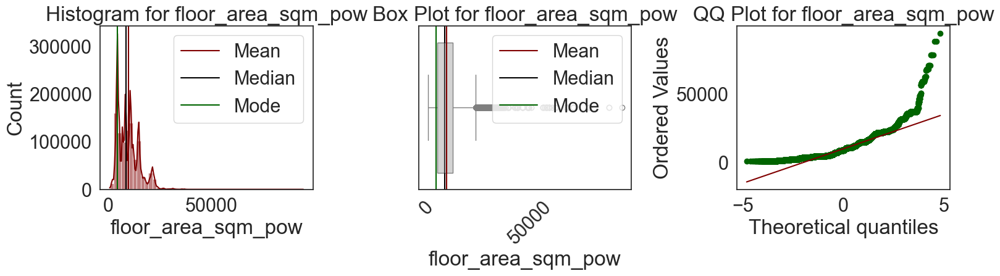



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




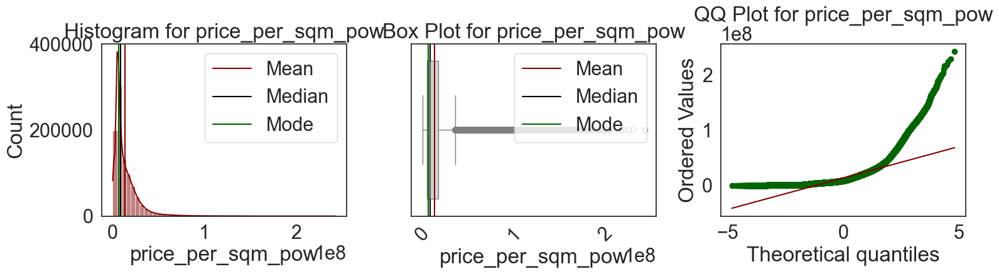



Skew for price_per_sqm_pow is 2.99

Kurtosis for price_per_sqm_pow is 14.96




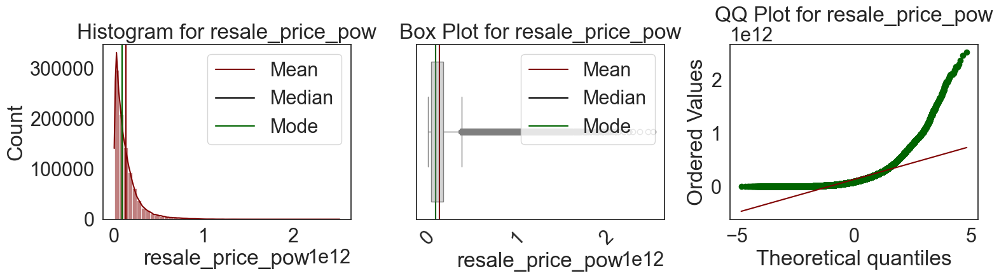



Skew for resale_price_pow is 2.81

Kurtosis for resale_price_pow is 13.23




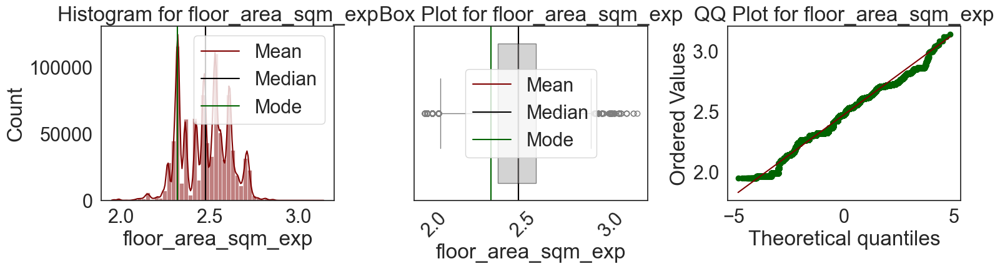



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




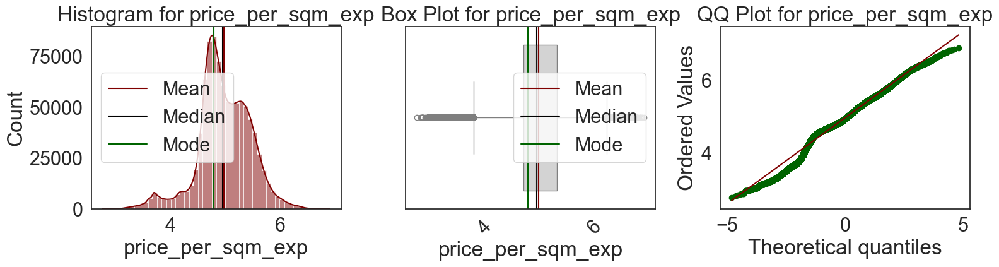



Skew for price_per_sqm_exp is -0.37

Kurtosis for price_per_sqm_exp is 0.93




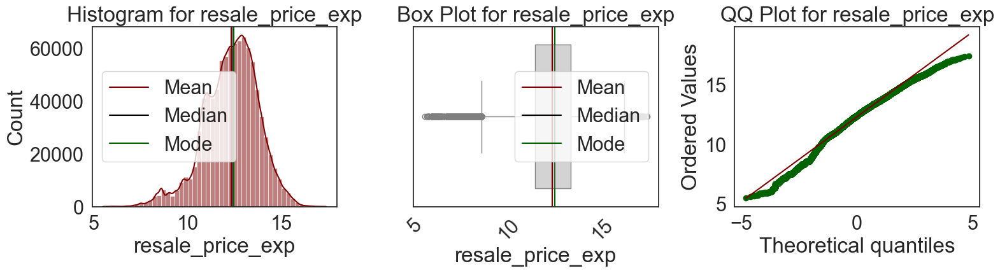



Skew for resale_price_exp is -0.46

Kurtosis for resale_price_exp is 0.48




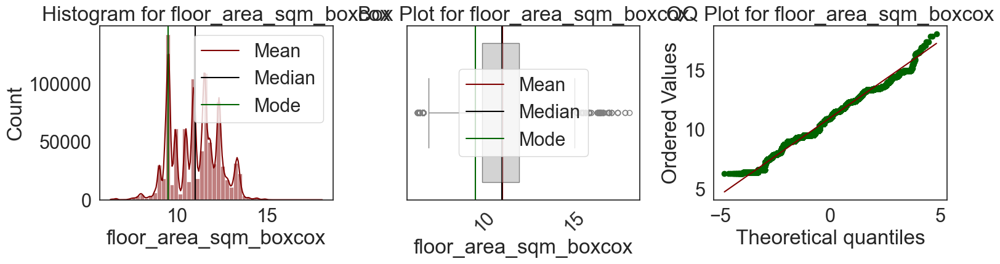



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




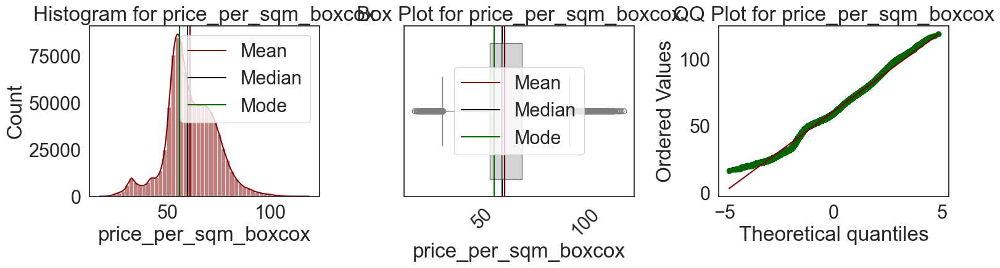



Skew for price_per_sqm_boxcox is 0.04

Kurtosis for price_per_sqm_boxcox is 0.57




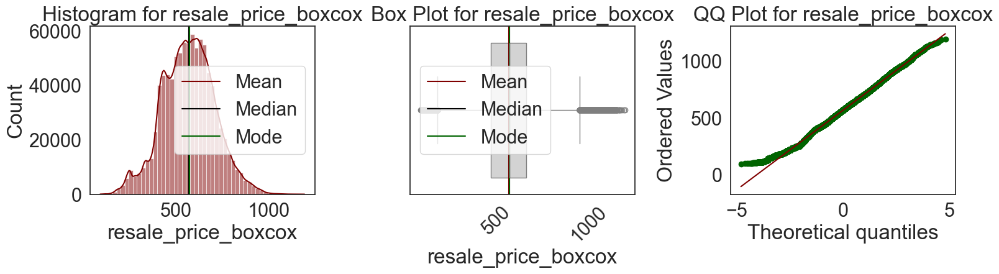



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'price_per_sqm_log': -0.8184514040088072, 'resale_price_log': -0.9240431018462136, 'floor_area_sqm_square': 0.07508402, 'price_per_sqm_square': 0.218400005682388, 'resale_price_square': 0.10918464819090822, 'floor_area_sqm_rec': 1.1036736, 'price_per_sqm_rec': 4.092842125511875, 'resale_price_rec': 7.24332894254145, 'floor_area_sqm_sig': 0.0, 'price_per_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'price_per_sqm_pow': 2.9859800621469907, 'resale_price_pow': 2.810519042318628, 'floor_area_sqm_exp': -0.10569635, 'price_per_sqm_exp': -0.3680042268192765, 'resale_price_exp': -0.4641821320745675, 'floor_area_sqm_boxcox': -0.016471082, 'price_per_sqm_boxcox': 0.037947014786446534, 'resale_price_boxcox': -0.0005540558944127643} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'price_per_sqm_log': 1.868267357554061, 'resale_price_log': 1

In [70]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1[df1.storey_range]

## Handling Outliers

### Function to handle outliers based on categorical variables

In [99]:
def handle_outliers(df, continuous_var, categorical_vars, iqr_multiplier=1.5):
    df_copy = df.copy()
    outlier_count = 0
    
    # Group by all categorical variables at once
    grouped = df_copy.groupby(categorical_vars,observed=True)
    
    def replace_outliers(group):
        nonlocal outlier_count
        Q1 = group[continuous_var].quantile(0.25)
        Q3 = group[continuous_var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - iqr_multiplier * IQR
        upper_bound = Q3 + iqr_multiplier * IQR
        
        # Count outliers
        outliers = (group[continuous_var] < lower_bound) | (group[continuous_var] > upper_bound)
        outlier_count += outliers.sum()
        
        # Cap outliers instead of replacing with median
        group.loc[group[continuous_var] < lower_bound, continuous_var] = lower_bound
        group.loc[group[continuous_var] > upper_bound, continuous_var] = upper_bound
        
        return group[continuous_var]

    # Apply the function and update only the continuous variable
    df_copy[continuous_var] = grouped[continuous_var].transform(replace_outliers)
    
    print(f"Total outliers handled: {outlier_count}")
    return df_copy

### List of categorical variables that influence resale_price

In [95]:
categorical_vars = ['year','flat_type','town']

### Apply the function to handle outliers

In [96]:
df1.columns

Index(['town', 'flat_type', 'floor_area_sqm', 'storey_range', 'flat_model',
       'lease_commence_date', 'resale_price', 'floor_area_category',
       'price_per_sqm', 'year', 'month_number', 'full_address',
       'remaining_lease_year', 'test', 'pe'],
      dtype='object')

In [97]:
df1['full_address'] = df1['full_address'].astype('category')
df1['floor_area_sqm'] = pd.to_numeric(df1['floor_area_sqm'], errors='coerce')
df1['floor_area_sqm'] = df1['floor_area_sqm'].astype('float')
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   town                  927465 non-null  category
 1   flat_type             927465 non-null  category
 2   floor_area_sqm        927465 non-null  float64 
 3   storey_range          927465 non-null  category
 4   flat_model            927465 non-null  category
 5   lease_commence_date   927465 non-null  int32   
 6   resale_price          927465 non-null  float64 
 7   floor_area_category   927465 non-null  category
 8   price_per_sqm         927465 non-null  float64 
 9   year                  927465 non-null  int32   
 10  month_number          927465 non-null  int32   
 11  full_address          927465 non-null  category
 12  remaining_lease_year  927465 non-null  int32   
 13  test                  927465 non-null  int8    
 14  pe                    927465 non-null  fl

In [103]:
df1

,town,flat_type,floor_area_sqm,storey_range,flat_model,lease_commence_date,resale_price,floor_area_category,price_per_sqm,year,month_number,full_address,remaining_lease_year,test,pe
0,Ang Mo Kio,1 Room,31.0,10 TO 12,Improved,1977,9000.0,Small,290.322581,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
1,Ang Mo Kio,1 Room,31.0,04 TO 06,Improved,1977,6000.0,Small,193.548387,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
2,Ang Mo Kio,1 Room,31.0,10 TO 12,Improved,1977,8000.0,Small,258.064516,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
3,Ang Mo Kio,1 Room,31.0,07 TO 09,Improved,1977,6000.0,Small,193.548387,1990,1,309 Ang Mo Kio Ave 1 Ang Mo Kio,86,1,31.0
4,Ang Mo Kio,3 Room,73.0,04 TO 06,New Generation,1976,47200.0,Small,646.575342,1990,1,216 Ang Mo Kio Ave 1 Ang Mo Kio,85,3,73.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,Yishun,5 Room,112.0,10 TO 12,Improved,2018,738000.0,Large,6589.285714,2024,6,502B Yishun St 51 Yishun,93,5,112.0
181258,Yishun,5 Room,122.0,07 TO 09,Improved,1988,680000.0,Very Large,5573.770492,2024,6,865 Yishun St 81 Yishun,63,5,122.0
181259,Yishun,Executive,146.0,10 TO 12,Maisonette,1986,790000.0,Very Large,5410.958904,2024,6,723 Yishun St 71 Yishun,61,0,146.0
181260,Yishun,Executive,146.0,10 TO 12,Maisonette,1988,1000000.0,Very Large,6849.315068,2024,6,826 Yishun St 81 Yishun,63,0,146.0


In [110]:
grouped = df1.groupby(categorical_vars,observed=True)
# print(list(grouped))

In [102]:
# df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)
# df1_cleaned = handle_outliers(df1, 'floor_area_sqm', categorical_vars)
df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)

KeyError: 'resale_price'

## Exploratory Data Analysis. After Handling Skewness and Outliers

In [ ]:
df1_cleaned.describe().T

In [ ]:
color_good = '\033[32m'  # Dark Green for good skew
color_okay = '\033[92m'  # Light Green for okay skew
color_bad = '\033[91m'  # Maroon for bad skew
color_neutral = '\033[0m'  # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in continuous:
    univar_num(df1_cleaned,i) 
    skew_val = df1_cleaned[i].skew()
    
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
        skewed_col.append(i)

    print(f"\n{color}Skew for {i} is {skew_val:.2f}{color_neutral}\n")

In [ ]:
normalized_df_cleaned=skewness_checker(df1_cleaned, continuous, method_functions)
normalized_df_cleaned

In [ ]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df_cleaned.columns:
    univar_num(normalized_df_cleaned,i)
    skews=normalized_df_cleaned[i].skew()
    kurt=normalized_df_cleaned[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1.sample(5)

In [ ]:
df1.sample(5)